# MITx - 6.419x
## Data Analysis: Statistical Modeling and Computation in Applications: Spring 2021
### Homework 2: Written Report by J. Andrew Seidel

# **Part 1: Visualization**

A scientist tells you that cells in the brain are either excitatory neurons, inhibitory neurons, or non-neuronal cells. Cells from each of these three groups serve different functions within the brain. Within each of these three types, there are numerous distinct sub-types that a cell can be, and sub-types of the same larger class can serve similar functions. Your goal is to produce visualizations which show how the scientist's knowledge reflects in the data.

As in Problem 1, we recommend using PCA before running T-SNE or clustering algorithms, for quality and computational reasons.

(3 points) Provide at least one visualization which clearly shows the existence of the three main brain cell types described by the scientist, and explain how it shows this. Your visualization should support the idea that cells from a different group (for example, excitatory vs inhibitory) can differ greatly.

Provide at least one visualization which supports the claim that within each of the three types, there are numerous possible sub-types for a cell. In your visualization, highlight which of the three main types these sub-types belong to. Again, explain how your visualization supports the claim.

In [4]:
#Import Libraries and set plotting parameters
%matplotlib inline
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt 
import seaborn as sn 

from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans
from sklearn.manifold import MDS
from sklearn.linear_model import LogisticRegression, LogisticRegressionCV
from sklearn import preprocessing

from yellowbrick.cluster import SilhouetteVisualizer
from yellowbrick.style import rcmod
from yellowbrick.style.colors import resolve_colors

# Ignore the warning that will pop up when we do rcmod.reset_orig()
import warnings
warnings.simplefilter(action='ignore', category=plt.cbook.MatplotlibDeprecationWarning)
# Yellowbrick changes the plotting settings, reset to default here

rcmod.reset_orig()

In [5]:
#Load and Transform the p2_unsupervised data set
X = np.load('./data/p2_unsupervised/X.npy')
print(X.shape)
X_log = np.log2(X+1)


(2169, 45768)


In [5]:
#Run PCA reduction and plot first two components
pca_log = PCA()
z = pca_log.fit_transform(X_log)
np.save("z_pca.npy",z)

In [6]:
#Skip above to save time when resetting jupyter kernel
z = np.load("z_pca.npy")

## We begin by performing a log transform for the data and plotting its first two principal components, shown below

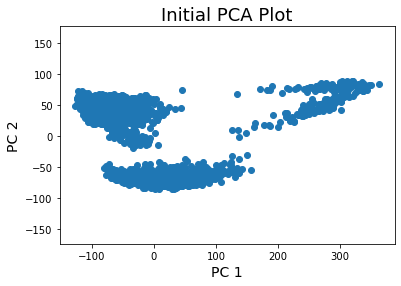

In [7]:
plt.scatter(z[:,0],z[:,1])
plt.title("Initial PCA Plot",size=18)
plt.xlabel("PC 1",size=14)
plt.ylabel("PC 2",size=14)
plt.axis("equal")
plt.show()

## Above, we can clearly identify 3 distinct types. Below we perform k-means clustering and look at the Sum of Squares criterion across various values of k. The plot below shows a deceleration around k=3, which is consistent with our initial observations above.

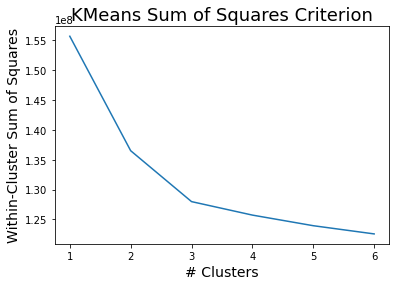

In [8]:
max_k = 6
all_kmeans = [KMeans(n_clusters=i+1,n_init=10, max_iter=600) for i in range (max_k)]
for i in range(max_k):
   all_kmeans[i].fit(X_log)

inertias = [all_kmeans[i].inertia_ for i in range(max_k)]

plt.plot(np.arange(1,max_k+1),inertias)
plt.title("KMeans Sum of Squares Criterion",size=18)
plt.xlabel("# Clusters",size=14)
plt.ylabel("Within-Cluster Sum of Squares",size=14)
plt.show()

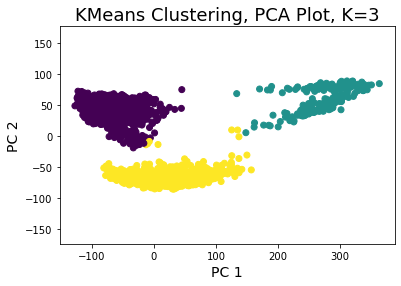

In [9]:
k = 3
y = all_kmeans[k-1].fit_predict(z)
plt.scatter(z[:,0],z[:,1], c=y)
plt.title("KMeans Clustering, PCA Plot, K="+str(k),size=18)
plt.xlabel("PC 1",size=14)
plt.ylabel("PC 2",size=14)
plt.axis("equal")
plt.show()

## With the data now clustered into 3 types, we see that pairplots of the first 5 principal components show that even within clusters, there are distinct sub-type groupings, and that data within the same group may differ significantly. Along the diagonal of the plot below, we also see the dispersion and multiple local maxima within a principal component, which also suggests there may be sub-types and differences within types. 

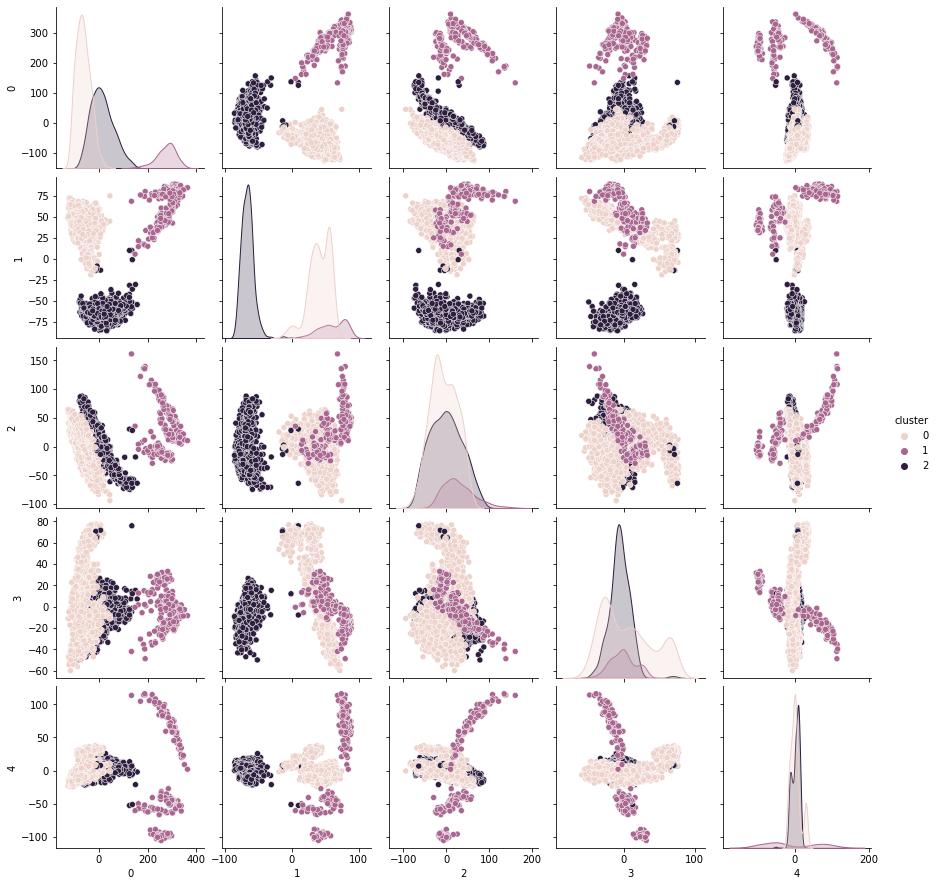

In [10]:
zdf = pd.DataFrame(z)
zdf.insert(loc=0, column='cluster', value=y)
sn.pairplot(zdf.iloc[:,0:6], hue='cluster')

In [ ]:
## Additionally, we can use t-Stochastic Neighbor Embedding (t-SNE) on the principal components to visualize the type groupings, as well as any sub-type groupings.  t-SNE results are plotted below

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 2169 samples in 0.001s...
[t-SNE] Computed neighbors for 2169 samples in 0.754s...
[t-SNE] Computed conditional probabilities for sample 1000 / 2169
[t-SNE] Computed conditional probabilities for sample 2000 / 2169
[t-SNE] Computed conditional probabilities for sample 2169 / 2169
[t-SNE] Mean sigma: 26.431555
[t-SNE] KL divergence after 250 iterations with early exaggeration: 55.763012
[t-SNE] KL divergence after 1000 iterations: 0.540890


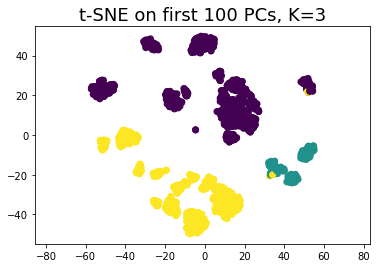

In [12]:
k=3
perplex = 40
PCA_Dim = 100
title = "t-SNE on first " + str(PCA_Dim) + " PCs, K=" + str(k)
tsne = TSNE(n_components=2,verbose=1,perplexity=perplex, learning_rate=200, early_exaggeration=12)
z_tsne = tsne.fit_transform(z[:,0:PCA_Dim])
plt.scatter(z_tsne[:,0],z_tsne[:,1],c=y)
plt.title(title,size=18)
plt.axis("equal")
plt.show()



## As we did for the PCA analysis, we can also pairplot the t-SNE results. Below, we can again see the groupings, dispersion and multiple local maxima, which all suggest that there are infact sub-type groupings.

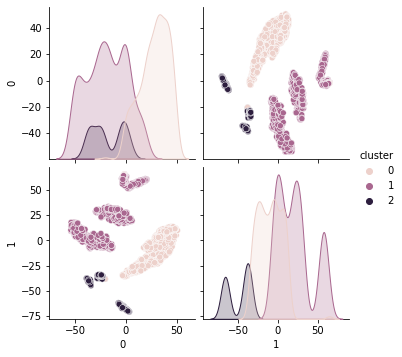

In [129]:
ztsnedf = pd.DataFrame(z_tsne)
ztsnedf.insert(loc=0, column='cluster', value=y)
sn.pairplot(ztsnedf.iloc[:,0:3], hue='cluster')

## Above, we can clearly see three sub-type groupings each for clusters 1 and cluster 2.  For cluster 0, it appears there may be 2 sub-type groupings.  Below, We divide the data set into the three separate clusters, and again use k-means to plot the different sub-type groups withing the cluster.

In [118]:
#subdivide the original 3 clusters into their own stand-alone group
z_tsne_1 = np.take(z_tsne, np.where(y == 0)[0], axis=0)
z_tsne_2 = np.take(z_tsne, np.where(y == 1)[0], axis=0)
z_tsne_3 = np.take(z_tsne, np.where(y == 2)[0], axis=0)

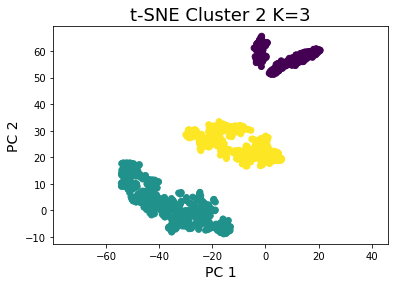

In [126]:
k_2 = 3
kmeans_tsne_2 = KMeans(n_clusters=k_2,n_init=10)

y_tsne_2 = kmeans_tsne_2.fit_predict(z_tsne_2)
plt.scatter(z_tsne_2[:,0],z_tsne_2[:,1], c=y_tsne_2)
title = "t-SNE Cluster 2 K=" + str(k_2)
plt.title(title,size=18)
plt.xlabel("PC 1",size=14)
plt.ylabel("PC 2",size=14)
plt.axis("equal")
plt.show()

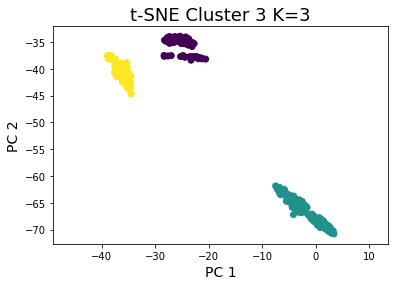

In [191]:
k_3 = 3
kmeans_tsne_3 = KMeans(n_clusters=k_3,n_init=10)

y_tsne_3 = kmeans_tsne_3.fit_predict(z_tsne_3)
plt.scatter(z_tsne_3[:,0],z_tsne_3[:,1], c=y_tsne_3)
title = "t-SNE Cluster 3 K=" + str(k_3)
plt.title(title,size=18)
plt.xlabel("PC 1",size=14)
plt.ylabel("PC 2",size=14)
plt.axis("equal")
plt.show()

## From the below Silhouette Plot, we can also see significant deviation of coefficient values within the same cluster, which provides further indication of differences within clusters and specific sub-types.

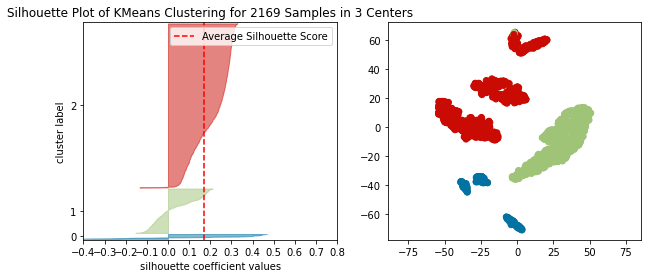

In [198]:
visualizers = SilhouetteVisualizer(all_kmeans[2], colors='yellowbrick',is_fitted=True)

fig, (ax1, ax2) = plt.subplots(1, 2,figsize=(10,4))
visualizer = SilhouetteVisualizer(all_kmeans[2], colors='yellowbrick',is_fitted=True,ax=ax1)
visualizer.fit(X)
    
colors = np.array(resolve_colors(3,"yellowbrick"))
ax2.scatter(z_tsne[:,0],z_tsne[:,1],c=colors[all_kmeans[2].labels_])
ax2.axis("equal")
    
# If we want to set axes to be the same for all plots, need to do something like this
# instead of visualizer.show(), which resets the axes
visualizer.finalize()
ax1.set_xlim((-.4,.8))
plt.show()

# **Part 2: Unsupervised Feature Selection**

Now we attempt to find informative genes which can help us differentiate between cells, using only unlabeled data. A genomics researcher would use specialized, domain-specific tools to select these genes. We will instead take a general approach using logistic regression in conjunction with clustering. Briefly speaking, we will use the p2_unsupervised dataset to cluster the data. Treating those cluster labels as ground truth, we will fit a logistic regression model and use its coefficients to select features. Finally, to evaluate the quality of these features, we will fit another logistic regression model on the training set in p2_evaluation, and run it on the test set in the same folder.

1) Using your clustering method(s) of choice, find a suitable clustering for the cells. Support your choice of clustering with appropriate visualizations and/or numerical findings. Be sure to briefly explain how you chose the number of clusters.

2) We will now treat your cluster assignments as labels for supervised learning. Fit a logistic regression model to the original data (not principal components), with your clustering as the target labels. Since the data is high-dimensional, make sure to regularize your model using your choice of ℓ1, ℓ2, or elastic net, and separate the data into training and validation or use cross-validation to select your model. Report your choice of regularization parameter and validation performance.

3) Select the features with the top 100 corresponding coefficient values (since this is a multi-class model, you can rank the coefficients using the maximum absolute value over classes, or the sum of absolute values). Take the evaluation training data and use a subset of the genes, consisting of the features you selected. Train a logistic regression classifier on this training data, and evaluate its performance on the evaluation test data. Report your score. Compare with two baselines: random features (take a random selection of 100 genes), and high-variance features (take the 100 genes with highest variance). Compare the variances of the features you selected with the highest variance features by plotting a histogram of the variances of features selected by both methods.

## While still using the same unsupervised dataset above, this time we log transform, but also scale the unsupervised data. We then perform PCA, and again see the same familiar clustering into three main types as previously seen in the prior problem above.

In [2]:
#Load and Transform the p2_unsupervised data set
X = np.load('./data/p2_unsupervised/X.npy')
X_log = np.log2(X+1)
scaler = preprocessing.StandardScaler().fit(X_log)
X_scaled = scaler.transform(X_log)

In [3]:
#Run PCA reduction and plot first two components
pca_scaled = PCA()
z_scaled = pca_scaled.fit_transform(X_scaled)
np.save("z_scaled.npy",z_scaled)

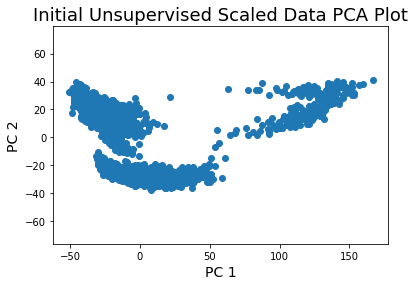

In [4]:
plt.scatter(z_scaled[:,0],z_scaled[:,1])
plt.title("Initial Unsupervised Scaled Data PCA Plot",size=18)
plt.xlabel("PC 1",size=14)
plt.ylabel("PC 2",size=14)
plt.axis("equal")
plt.show()

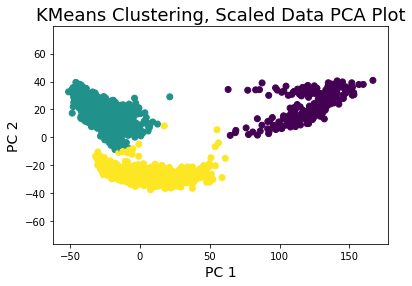

In [5]:
k=3
kmeans_scaled = KMeans(n_clusters=k,n_init=10, max_iter=600)
y_scaled = kmeans_scaled.fit_predict(z_scaled)
plt.scatter(z_scaled[:,0],z_scaled[:,1], c=y_scaled)
plt.title("KMeans Clustering, Scaled Data PCA Plot",size=18)
plt.xlabel("PC 1",size=14)
plt.ylabel("PC 2",size=14)
plt.axis("equal")
plt.show()

In [ ]:
## From here, we perform t-SNE but now with scaled data and also with additional PCA dimensionality than previously done above. In the t-SNE plot below, we have many more distinct sub-type clusterings. 

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 2169 samples in 0.001s...
[t-SNE] Computed neighbors for 2169 samples in 0.735s...
[t-SNE] Computed conditional probabilities for sample 1000 / 2169
[t-SNE] Computed conditional probabilities for sample 2000 / 2169
[t-SNE] Computed conditional probabilities for sample 2169 / 2169
[t-SNE] Mean sigma: 13.885831
[t-SNE] KL divergence after 250 iterations with early exaggeration: 59.597168
[t-SNE] KL divergence after 1000 iterations: 0.572397


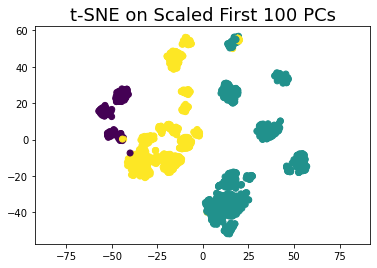

In [10]:
perplex = 40
PCA_Dim = 100
title = "t-SNE on Scaled First " + str(PCA_Dim) + " PCs"
tsne_scaled = TSNE(n_components=2,verbose=1,perplexity=perplex, learning_rate=500, early_exaggeration=12)
z_scaled_tsne = tsne_scaled.fit_transform(z_scaled[:,0:PCA_Dim])
plt.scatter(z_scaled_tsne[:,0],z_scaled_tsne[:,1], c=y_scaled)
plt.title(title,size=18)
plt.axis("equal")
plt.show()

In [11]:
np.save("z_scaled_tsne.npy",z_scaled_tsne)

In [3]:
z_scaled_tsne = np.load("z_scaled_tsne.npy")

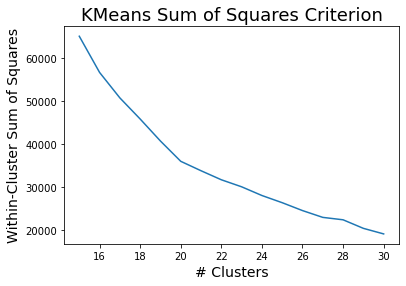

In [12]:
max_k = 30
all_kmeans_scaled = [KMeans(n_clusters=i+1,n_init=10, max_iter=600) for i in range (max_k)]
for i in range(max_k):
   all_kmeans_scaled[i].fit(z_scaled_tsne)

inertias_scaled = [all_kmeans_scaled[i].inertia_ for i in range(max_k)]

plt.plot(np.arange(15,max_k+1),inertias_scaled[14:])
plt.title("KMeans Sum of Squares Criterion",size=18)
plt.xlabel("# Clusters",size=14)
plt.ylabel("Within-Cluster Sum of Squares",size=14)
plt.show()

## Above, we have a deceleration of sum of squares values within clusters. We note a slight "bend" in at k=20 and also at k=27, and while there are other points along this curve we could choose, the KMeans plot below with K=27 provides enough distinction to recognize the outer groupings individually, while also drawing some distinctions within the larger clusterings at the center and left side.

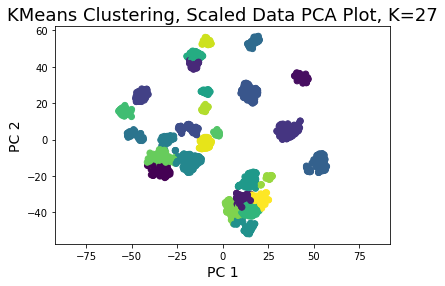

In [13]:
k=27
kmeans_scaled = KMeans(n_clusters=k,n_init=10, max_iter=600)
y_scaled2 = kmeans_scaled.fit_predict(z_scaled_tsne)
plt.scatter(z_scaled_tsne[:,0],z_scaled_tsne[:,1], c=y_scaled2)
plt.title("KMeans Clustering, Scaled Data PCA Plot, K="+str(k),size=18)
plt.xlabel("PC 1",size=14)
plt.ylabel("PC 2",size=14)
plt.axis("equal")
plt.show()
np.save("y_scaled2.npy",y_scaled2)

In [4]:
y_scaled2 = np.load("y_scaled2.npy")

## With labels assigned from the above K-means clustering above, we now fit a logistic regression model with cross validation to the log transformed and scaled data set. 

## We use L1 LASSO regression for regularlization, as this eliminates less important features, setting their coefficient to zero, and we use log steps increments for our regularization term.  

## For cross validation, we set the number of folds at 5, and train on 80% of the dataset, and test on 20%, as is commonly done.

## To optimize time efficiency, we use Stochastic Average Gradient descent (SAGA version) solver



In [14]:
log_reg = LogisticRegressionCV(cv=5,Cs=[0.01],max_iter=1000,penalty="l1",solver="saga",multi_class="ovr", n_jobs=-1, tol=.001)
log_reg.fit(X_scaled,y_scaled2)


In [2]:
log_reg.score(X_scaled,y_scaled2)

0.9694366197183099


## The above regularized logistic model performs well, scoring near 1.0.  With this, we then take its coefficients and apply them to training and test data for further evaluation.  Below, we selection the 100 features with the highest regression coefficients.

In [31]:
sum_abs_coefs = np.sum(np.abs(log_reg.coef_), axis=0)
key_features = np.argsort(sum_abs_coefs)[::-1][100]


In [6]:
#Load the p2_evaluation data set
X_test = np.load('./data/p2_evaluation/X_test.npy')
X_train = np.load('./data/p2_evaluation/X_train.npy')
y_test = np.load('./data/p2_evaluation/y_test.npy')
y_train = np.load('./data/p2_evaluation/y_train.npy')

X_train_log = np.log2(X_train+1)
X_test_log = np.log2(X_test+1)

#We use the same scaler to avoid data leakage between the training and test sets
scaler = preprocessing.StandardScaler().fit(X_train_log)
X_train_scaled = scaler.transform(X_train_log)
X_test_scaled = scaler.transform(X_test_log)



In [24]:
X_train_var = np.var(X_train, axis=0)
X_train_var_indices = np.argsort(X_train_var)
X_train_var_100 = X_train_var[X_train_var_indices][-100 : ]
X_train_var_100.shape

X_rand_indices = np.random.randint(0, X_train_var.shape[0], 100,)
X_rand_var_100 = X_train_var[X_rand_indices]
#print(X_train_var_100.shape, X_rand_var_100.shape)



(100,) (100,)


(array([[6.76315738e-08, 1.43896966e-09, 7.19484828e-10, 0.00000000e+00,
         0.00000000e+00, 0.00000000e+00, 7.19484828e-10, 7.19484828e-10,
         0.00000000e+00, 7.19484828e-10],
        [6.76315738e-08, 1.43896966e-09, 7.19484828e-10, 0.00000000e+00,
         0.00000000e+00, 0.00000000e+00, 7.19484828e-10, 7.19484828e-10,
         0.00000000e+00, 7.19484828e-10],
        [7.19484828e-08, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
         0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
         0.00000000e+00, 0.00000000e+00]]),
 array([0.00000000e+00, 1.38988337e+07, 2.77976675e+07, 4.16965012e+07,
        5.55953350e+07, 6.94941687e+07, 8.33930024e+07, 9.72918362e+07,
        1.11190670e+08, 1.25089504e+08, 1.38988337e+08]),
 <a list of 3 BarContainer objects>)

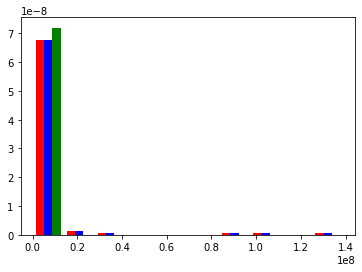

In [32]:
n_bins = 10
colors = ['red', 'blue', 'green']
plt.hist([X_test_var_100, X_train_var_100, X_rand_var_100], density=True, histtype='bar', color=colors, label=['Test Var','High Var', 'Rand Var'])

## Above, we compare distrubtion of variances of the unsupervised set, with the evaluation set and a random set of feature variances.  We find the randomly selected feature variances be nearly all around zero, while the unsupervised regression feature set and the evaluation feature set both have distribution which have more highly skewed variances for certain features. 

# **Problem3: Influence of Hyper-parameters**

The hyper-parameter choices used in data analysis techniques can have a large impact on the inferences made. As you may have encountered, finding the best choice of parameter such as perplexity in T-SNE or the number of clusters can be an ambiguous problem. We will now investigate the sensitivity of your results to changes in these hyper-parameters, with the goal of understanding how your conclusions may vary depending on these choices.

Problem 3.1: When we created the T-SNE plot in Problem 1, we ran T-SNE on the top 50 PC's of the data. But we could have easily chosen a different number of PC's to represent the data. Run T-SNE using 10, 50, 100, 250, and 500 PC's, and plot the resulting visualization for each. What do you observe as you increase the number of PC's used?

In [24]:
X_p3 = np.load('./data/p1/X.npy')
X_p3_log = np.log2(X_p3+1)

pca_p3 = PCA()
z_p3 = pca_p3.fit_transform(X_p3_log)
np.save("z_p3.npy",z_p3)

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 511 samples in 0.001s...
[t-SNE] Computed neighbors for 511 samples in 0.017s...
[t-SNE] Computed conditional probabilities for sample 511 / 511
[t-SNE] Mean sigma: 12.065659
[t-SNE] KL divergence after 250 iterations with early exaggeration: 52.924744
[t-SNE] KL divergence after 1000 iterations: 0.306118


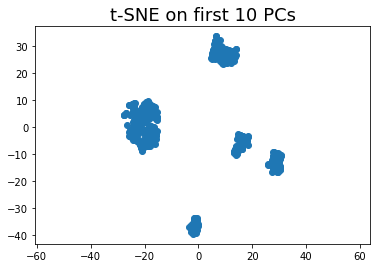

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 511 samples in 0.000s...
[t-SNE] Computed neighbors for 511 samples in 0.022s...
[t-SNE] Computed conditional probabilities for sample 511 / 511
[t-SNE] Mean sigma: 22.193587
[t-SNE] KL divergence after 250 iterations with early exaggeration: 58.654533
[t-SNE] KL divergence after 1000 iterations: 0.397287


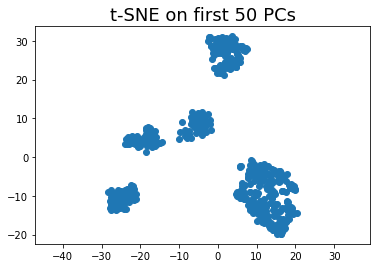

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 511 samples in 0.000s...
[t-SNE] Computed neighbors for 511 samples in 0.042s...
[t-SNE] Computed conditional probabilities for sample 511 / 511
[t-SNE] Mean sigma: 31.646870
[t-SNE] KL divergence after 250 iterations with early exaggeration: 62.342648
[t-SNE] KL divergence after 1000 iterations: 0.550304


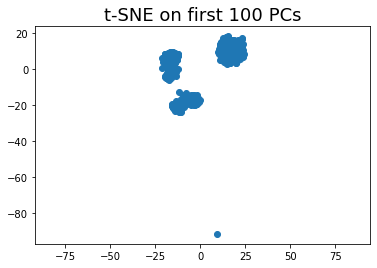

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 511 samples in 0.001s...
[t-SNE] Computed neighbors for 511 samples in 0.105s...
[t-SNE] Computed conditional probabilities for sample 511 / 511
[t-SNE] Mean sigma: 48.102645
[t-SNE] KL divergence after 250 iterations with early exaggeration: 78.576645
[t-SNE] KL divergence after 1000 iterations: 0.720264


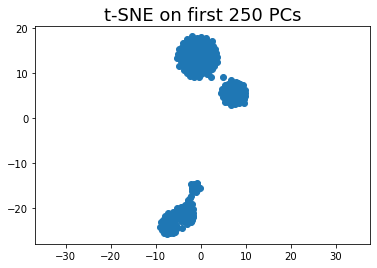

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 511 samples in 0.001s...
[t-SNE] Computed neighbors for 511 samples in 0.322s...
[t-SNE] Computed conditional probabilities for sample 511 / 511
[t-SNE] Mean sigma: 74.460724
[t-SNE] KL divergence after 250 iterations with early exaggeration: 100.305931
[t-SNE] KL divergence after 850 iterations: 1.093691


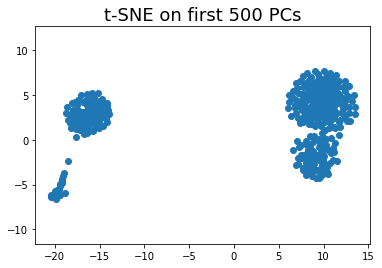

In [43]:
perplex = 40
PCA_Dim = [10, 50, 100, 250, 500]

for i in range(len(PCA_Dim)):
    tsne_p3 = TSNE(n_components=2,verbose=1,perplexity=perplex, learning_rate=200, early_exaggeration=12)
    z_p3_tsne = tsne_p3.fit_transform(z_p3[:,0:PCA_Dim[i]])
    plt.scatter(z_p3_tsne[:,0],z_p3_tsne[:,1])
    title = "t-SNE on first " + str(PCA_Dim[i]) + " PCs"
    plt.title(title,size=18)
    plt.axis("equal")
    #plt.xticks(range(-100, 100, 20))
    #plt.yticks(range(-150, 150, 25))
    plt.show()

## From the 5 t-SNE plots above with an increasing numbers of principal components included within each plot, we see that we gain some distinction between the data points and clusters as we go from 10 principal components to 50, but beyond that, the points converge into fewer clusters as the number of principal components increases.  Intuitively, as we increase the number of principle components to include those with smaller and smaller variances, the points appear more and more similar, and naturally, begin to cluster together more, when compared with relatively few principal components that have large variances.

Problem 3.2: (13 points) Pick three hyper-parameters below and analyze how changing the hyper-parameters affect the conclusions that can be drawn from the data. Please choose at least one hyper-parameter from each of the two categories (visualization and clustering/feature selection). At minimum, evaluate the hyper-parameters individually, but you may also evaluate how joint changes in the hyper-parameters affect the results. You may use any of the datasets we have given you in this project. For visualization hyper-parameters, you may find it productive to augment your analysis with experiments on synthetic data, though we request that you use real data in at least one demonstration.

## **T-SNE perplexity**

Below, we fix the number of PCA components to 50 and look at increasing levels of t-SNE perplexity with the following levels: 3, 30, 300, 3000. Perplexity is related to the number of nearest neighbors that is used, and can range from low values (eg 3), which uses relatively few neighbors to determine clustering and maintains smaller localized structures, to large values (eg 300+), which uses significantly more neighbors and maintains larger, global structures (fewer and larger clusters).  

Below we see fewer clusters with each iteration as perplexity increases. Perplexity can generally increase with increases in the number of observations in the dataset.  

With perplexity set to 3 (too low), we might conclude that there are dozens of clusters, and with perlexity set to 3000 (too high) we might conclude there there is a single central "ring" cluster and a six "satellite" clusters. 

Quantitatively, we see the shift from distinct clusters to a single central cluster with the decline in the KL value from 0.74 for perplexity 3 to a KL value of 0.06 for perplexity of 3000. This is expected as we broaden the range of data points included for t-SNE as we increase perlexity and shift toward the single global structure.    

[t-SNE] Computing 10 nearest neighbors...
[t-SNE] Indexed 511 samples in 0.000s...
[t-SNE] Computed neighbors for 511 samples in 0.030s...
[t-SNE] Computed conditional probabilities for sample 511 / 511
[t-SNE] Mean sigma: 11.334966
[t-SNE] KL divergence after 250 iterations with early exaggeration: 77.524994
[t-SNE] KL divergence after 1000 iterations: 0.743685


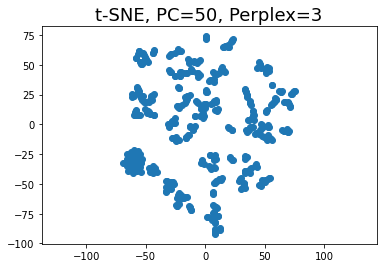

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 511 samples in 0.000s...
[t-SNE] Computed neighbors for 511 samples in 0.021s...
[t-SNE] Computed conditional probabilities for sample 511 / 511
[t-SNE] Mean sigma: 21.219204
[t-SNE] KL divergence after 250 iterations with early exaggeration: 61.697201
[t-SNE] KL divergence after 1000 iterations: 0.455415


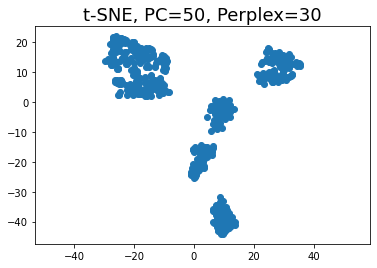

[t-SNE] Computing 510 nearest neighbors...
[t-SNE] Indexed 511 samples in 0.001s...
[t-SNE] Computed neighbors for 511 samples in 0.041s...
[t-SNE] Computed conditional probabilities for sample 511 / 511
[t-SNE] Mean sigma: 26.458044
[t-SNE] KL divergence after 250 iterations with early exaggeration: 42.529091
[t-SNE] KL divergence after 700 iterations: 0.105055


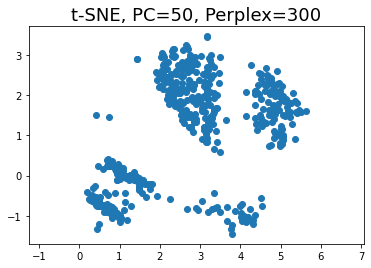

[t-SNE] Computing 510 nearest neighbors...
[t-SNE] Indexed 511 samples in 0.000s...
[t-SNE] Computed neighbors for 511 samples in 0.040s...
[t-SNE] Computed conditional probabilities for sample 511 / 511
[t-SNE] Mean sigma: 27.882869
[t-SNE] KL divergence after 250 iterations with early exaggeration: 34.320499
[t-SNE] KL divergence after 1000 iterations: 0.064676


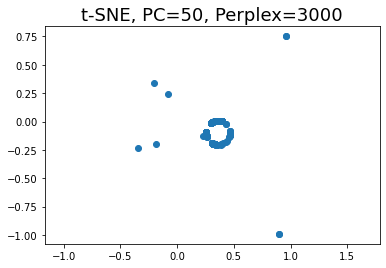

In [44]:
perplex = [3, 30, 300, 3000]
PCA_Dim = 50

for i in range(len(perplex)):
    tsne_p32 = TSNE(n_components=2,verbose=1,perplexity=perplex[i], learning_rate=200, early_exaggeration=12)
    z_p32_tsne = tsne_p32.fit_transform(z_p3[:,0:PCA_Dim])
    plt.scatter(z_p32_tsne[:,0],z_p32_tsne[:,1])
    title = "t-SNE, PC=50, Perplex=" + str(perplex[i])
    plt.title(title,size=18)
    plt.axis("equal")
    #plt.xticks(range(-100, 100, 20))
    #plt.yticks(range(-150, 150, 25))
    plt.show()



## **T-SNE Learning Rate**
Below, we fix the number of PCA components and perplexity and look at increasing levels of the t-SNE Learning Rate with the following levels: 1, 10, 100, 1000, 10000. Learning Rate is related to the step size during gradient descent when seeking minima for the cost function. Smaller learning rates may still eventually converge on a minima to optimize the custered structure, but require more interations. Below we limit the number of iterations to a relatively small 350 steps. 

We see that as the learning rate increase from 1 to 10 to 100, we have greater convergence toward clusters. However, for very large learning rates (eg 1000, 10,000) as seen below, the step size may be too large such that we step over the minima and do not converge toward an optimal clustering, and we lose distinction between clusters within the data. Quantitatively, we see this in the decline in the KL divergence from 0.84 when the learning rate is 1, to a KL value of 0.42 when the learning rate is 100, and then a increase in the KL value to 0.71 when the learning rate is 1000.  

In the plot where we set the learning rate to 100 and the lowest KL value, we might conlude there to be 5 large clusters, and perhaps a 6th or sub-type cluster within the largest cluster.  However, in the plot where we set the learning rate to 10,000, we might conclude that there is only a single cluster with a few outlier data points, but also note the large KL value associated with this result.

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 511 samples in 0.001s...
[t-SNE] Computed neighbors for 511 samples in 0.025s...
[t-SNE] Computed conditional probabilities for sample 511 / 511
[t-SNE] Mean sigma: 22.193587
[t-SNE] KL divergence after 250 iterations with early exaggeration: 48.944500
[t-SNE] KL divergence after 350 iterations: 0.848580


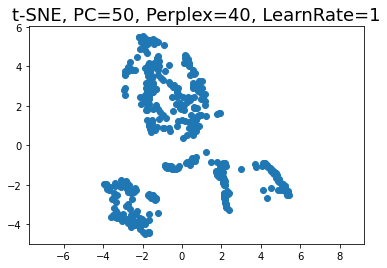

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 511 samples in 0.000s...
[t-SNE] Computed neighbors for 511 samples in 0.029s...
[t-SNE] Computed conditional probabilities for sample 511 / 511
[t-SNE] Mean sigma: 22.193587
[t-SNE] KL divergence after 250 iterations with early exaggeration: 49.016468
[t-SNE] KL divergence after 350 iterations: 0.500733


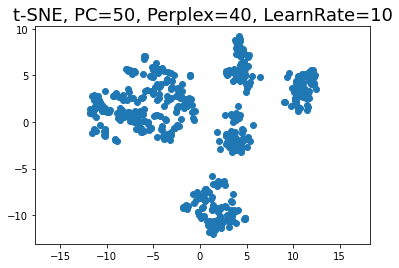

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 511 samples in 0.000s...
[t-SNE] Computed neighbors for 511 samples in 0.026s...
[t-SNE] Computed conditional probabilities for sample 511 / 511
[t-SNE] Mean sigma: 22.193587
[t-SNE] KL divergence after 250 iterations with early exaggeration: 52.027740
[t-SNE] KL divergence after 350 iterations: 0.423751


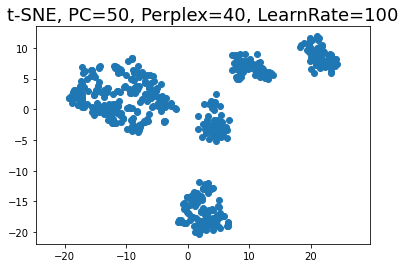

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 511 samples in 0.000s...
[t-SNE] Computed neighbors for 511 samples in 0.024s...
[t-SNE] Computed conditional probabilities for sample 511 / 511
[t-SNE] Mean sigma: 22.193587
[t-SNE] KL divergence after 250 iterations with early exaggeration: 67.607719
[t-SNE] KL divergence after 350 iterations: 0.708035


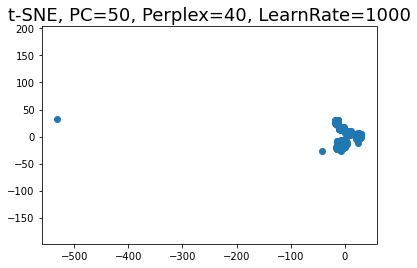

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 511 samples in 0.000s...
[t-SNE] Computed neighbors for 511 samples in 0.023s...
[t-SNE] Computed conditional probabilities for sample 511 / 511
[t-SNE] Mean sigma: 22.193587
[t-SNE] KL divergence after 250 iterations with early exaggeration: 100.295631
[t-SNE] KL divergence after 350 iterations: 4.417943


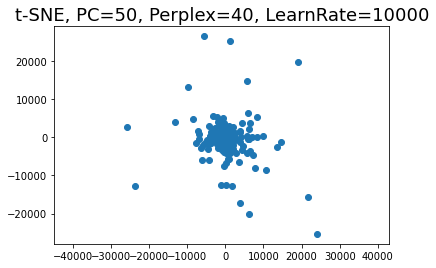

In [46]:
perplex = 40
PCA_Dim = 50
Learn_Rate = [1, 10, 100, 1000, 10000]

for i in range(len(Learn_Rate)):
    tsne_p32 = TSNE(n_components=2,verbose=1,perplexity=perplex, learning_rate=Learn_Rate[i], early_exaggeration=12, n_iter=350)
    z_p32_tsne = tsne_p32.fit_transform(z_p3[:,0:PCA_Dim])
    plt.scatter(z_p32_tsne[:,0],z_p32_tsne[:,1])
    title = "t-SNE, PC=50, Perplex=40, LearnRate=" + str(Learn_Rate[i])
    plt.title(title,size=18)
    plt.axis("equal")
    #plt.xticks(range(-100, 100, 20))
    #plt.yticks(range(-150, 150, 25))
    plt.show()

## **Type of regularization (L1, L2, elastic net) in the logistic regression step and how the resulting features selected differ**

Below, we logistic regression using both L1 LASSO regression and L2 Ridge Regression on the dataset from problem 1. From the coefficients of the two regressions we find non-zero values for 70 of the features (on average across the five classes) for L1 Lasso regression, which is significantly fewer than the 31723 features with non-zero coefficients for L2 Ridge regression. Taking the absolute value and averaging over the non-zero coefficients, we also see that the average coefficient value is signficantly higher for L1 Lasso regression (0.0021) than for L2 Ridge regression (0.000063).  

From this we see that the choice of regularization penalty influence both the count of features and the weight of each feature used for regression.  This ultimately also impacts the bias and variance of the model.  With L2 Ridge regression we may overfit the data, using a very high number of features prediction, based on the training set, which may yield low bias but a high amount of variance in the test set.  Conversely, with L1 LASSO regression, we simplify the model to use a smaller subset of features and reduce overfitting, which may increase bias within the training set, but may yield better (lower)variance within the test set. 


In [2]:
X_p33 = np.load("data/p1/X.npy")
y_p33 = np.load("data/p1/y.npy")
X_p33_log = np.log2(X_p33 + 1)
print(X_p33.shape, y_p33.shape)
print(np.unique(y_p33))

(511, 45768) (511,)
[0 1 2 3 4]


In [3]:
log_reg_l1 = LogisticRegression(C=.01,max_iter=100,penalty="l1",solver="saga",multi_class="ovr", n_jobs=-1)
log_reg_l1.fit(X_p33_log,y_p33)


C:\Users\jaseidel\AppData\Roaming\Python\Python38\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


LogisticRegression(C=0.01, multi_class='ovr', n_jobs=-1, penalty='l1',
                   solver='saga')

In [4]:
log_reg_l2 = LogisticRegression(C=.01,max_iter=100,penalty="l2",solver="saga",multi_class="ovr", n_jobs=-1)
log_reg_l2.fit(X_p33_log,y_p33)

C:\Users\jaseidel\AppData\Roaming\Python\Python38\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


LogisticRegression(C=0.01, multi_class='ovr', n_jobs=-1, solver='saga')

In [11]:
print("L1 LASSO Regression Average Count of Non-zero Coefficients across Classifications:", np.mean(np.count_nonzero(log_reg_l1.coef_,axis=1)))

print("L2 Ridge Regression Average Count of Non-zero Coefficients across Classifications:", np.mean(np.count_nonzero(log_reg_l2.coef_,axis=1)))

print("L1 LASSO Regression Average Absolute Value of Non-Zero Coefficients Across Features", np.average(np.sum(np.abs(log_reg_l1.coef_), axis=1)/np.count_nonzero(log_reg_l1.coef_)))

print("L2 Ridge Regression Average Absolute Value of Non-Zero Coefficients Across Features", np.average(np.sum(np.abs(log_reg_l2.coef_), axis=1)/np.count_nonzero(log_reg_l2.coef_)))

L1 LASSO Regression Average Count of Non-zero Coefficients across Classifications: 70.2
L2 Ridge Regression Average Count of Non-zero Coefficients across Classifications: 31723.0
L1 LASSO Regression Average Absolute Value of Non-Zero Coefficients Across Features 0.0020703344568008546
L2 Ridge Regression Average Absolute Value of Non-Zero Coefficients Across Features 6.285105257212468e-05
